# EMD Lung Sound

In [1]:
from matplotlib.pyplot import *
%matplotlib inline
 
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')

import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
font = FontProperties(fname = 'Charter.ttf', size = 10, weight = 1000)
font_small = FontProperties(fname = 'Charter.ttf', size = 7, weight = 1000)

In [2]:
import numpy as np
import librosa
import os
import librosa.display
import pandas as pd
import wave

import sys
import read_sound_split_sound

In [4]:
target_rate = 44100
data_path = 'audio_samples/'
file_names = [file_name for file_name in os.listdir(data_path) if '.wav' in file_name] 
audio_file = data_path + file_names[0]


sr, audio = read_sound_split_sound.read_wav_file(audio_file, target_rate)
audio = audio[0:min(int(5 * sr), len(audio))]
if '_Pr_' in audio_file:
    rec_location = ' Posterior Right '
else:
    rec_location = ' Anterior Left '

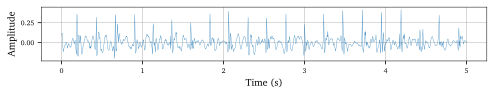

In [7]:
duration = float(len(audio)) / sr
T = 1.0/sr
N = int(duration / T)

y = audio
x = np.linspace(0.0, N*T, N)

fig, ax = plt.subplots(1,1)
fig.set_size_inches(8, 1)
ax.plot(x, y ,linewidth=0.3)

ax.spines['top'].set_linewidth(0.5)
ax.spines['right'].set_linewidth(0.5)
ax.spines['bottom'].set_linewidth(0.5)
ax.spines['left'].set_linewidth(0.5)
ax.grid(linewidth = 0.5)
for label in ax.get_xticklabels() :
    label.set_fontproperties(font_small)
for label in ax.get_yticklabels() :
    label.set_fontproperties(font_small)

ax.set_ylabel('Amplitude', fontproperties = font)
ax.set_xlabel('Time (s)' , fontproperties = font)
    
plt.savefig('raw_lung_plot_right.pdf' ,  bbox_inches='tight')

# Using highpass filter to filter out the HS

In [8]:
from scipy.signal import butter, lfilter

def butter_highpass(lowcut, fs, order=3):
    nyq = 0.5 * fs
    low = lowcut / nyq
    b, a = butter(order, low, btype='high')
    return b, a


def butter_highpass_filter(data, lowcut, fs, order=5):
    b, a = butter_highpass(lowcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

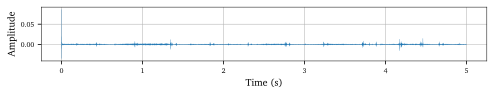

In [9]:
lowcut = 400

audio_f = butter_highpass_filter(audio , lowcut, sr)

fig, ax = plt.subplots(1,1)
fig.set_size_inches(8, 1)
ax.plot(x, audio_f ,linewidth=0.3)

ax.spines['top'].set_linewidth(0.5)
ax.spines['right'].set_linewidth(0.5)
ax.spines['bottom'].set_linewidth(0.5)
ax.spines['left'].set_linewidth(0.5)
ax.grid(linewidth = 0.5)
for label in ax.get_xticklabels() :
    label.set_fontproperties(font_small)
for label in ax.get_yticklabels() :
    label.set_fontproperties(font_small)

ax.set_ylabel('Amplitude', fontproperties = font)
ax.set_xlabel('Time (s)' , fontproperties = font)
    
plt.savefig('figures/HP_filter_left_400.pdf' ,  bbox_inches='tight')

# EMD

In [11]:
!pip install PyEMD

  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\andrinee\Anaconda3\python.exe' -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\andrinee\\AppData\\Local\\Temp\\pip-install-ixlqlri3\\PyEMD\\setup.py'"'"'; __file__='"'"'C:\\Users\\andrinee\\AppData\\Local\\Temp\\pip-install-ixlqlri3\\PyEMD\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\andrinee\AppData\Local\Temp\pip-wheel-f90fcx6_'
       cwd: C:\Users\andrinee\AppData\Local\Temp\pip-install-ixlqlri3\PyEMD\
  Complete output (11 lines):
  running bdist_wheel



  Running setup.py clean for PyEMD
Failed to build PyEMD
    Running setup.py install for PyEMD: started
    Running setup.py install for PyEMD: finished with status 'error'


  running build
  running build_py
  creating build
  creating build\lib.win-amd64-3.8
  creating build\lib.win-amd64-3.8\pyemd
  copying pyemd\__about__.py -> build\lib.win-amd64-3.8\pyemd
  copying pyemd\__init__.py -> build\lib.win-amd64-3.8\pyemd
  running build_ext
  building 'pyemd.emd' extension
  error: Microsoft Visual C++ 14.0 is required. Get it with "Build Tools for Visual Studio": https://visualstudio.microsoft.com/downloads/
  ----------------------------------------
  ERROR: Failed building wheel for PyEMD
    ERROR: Command errored out with exit status 1:
     command: 'C:\Users\andrinee\Anaconda3\python.exe' -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\andrinee\\AppData\\Local\\Temp\\pip-install-ixlqlri3\\PyEMD\\setup.py'"'"'; __file__='"'"'C:\\Users\\andrinee\\AppData\\Local\\Temp\\pip-install-ixlqlri3\\PyEMD\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(c

In [12]:
from PyEMD import EEMD
import numpy as np
import pylab as plt
from PyEMD import EMD
m_imf = 10
m_sift = 15

emd = EMD()
emd.spline_kind="slinear"
emd.FIXE = m_sift

# Execute EEMD on S
IMFs = emd.emd(audio, x, max_imf = m_imf)
nIMFs = IMFs.shape[0]
_, residue = emd.get_imfs_and_residue()

# Plot results
fig, axarr = plt.subplots(nIMFs+2)
fig.set_size_inches(8, 8)
axarr[0].plot(x, audio, 'r' , linewidth = 0.3)
axarr[0].set_ylabel("original\n audio" , fontproperties = font_small)
axarr[0].label_outer()

for n in range(nIMFs):
    axarr[n + 1].plot(x, IMFs[n], 'g', linewidth = 0.3)
    axarr[n + 1].set_ylabel("IMF\n %i" %(n), fontproperties = font_small)
    axarr[n + 1].label_outer()

axarr[nIMFs+1].plot(x, residue, 'b', linewidth = 0.3)
axarr[nIMFs+1].set_ylabel("Residue", fontproperties = font_small)
axarr[nIMFs+1].set_xlabel("Time [s]", fontproperties = font)

for ax in axarr:
    ax.spines['top'].set_linewidth(0.5)
    ax.spines['right'].set_linewidth(0.5)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)
    ax.grid(linewidth = 0.3)
    
for label in ax[nIMFs+1].get_xticklabels() :
    label.set_fontproperties(font_small)

fig.show()
#fig.savefig('EMD_bad.svg', bbox_inches='tight')

ModuleNotFoundError: No module named 'PyEMD'

# EEMD on the LEFT signal (heart is extra prominant)

In [201]:
neIMFs_left = neIMFs
eIMFs_left = eIMFs
residue_left = e_residue

# EEMD on the right signal


In [130]:
neIMFs_right = neIMFs
eIMFs_right = eIMFs
residue_right = e_residue

## EEMD

In [200]:
from PyEMD import EEMD
import numpy as np
import pylab as plt
from PyEMD import EMD
m_imf = 10
m_sift = 15
m_trials = 5
# Say we want detect extrema using parabolic method
eemd = EEMD(trials=m_trials)
eemd.spline_kind="slinear"
eemd.FIXE = m_sift


# Execute EEMD on S
eIMFs = eemd.eemd(audio, x, max_imf = m_imf)
neIMFs = eIMFs.shape[0]
_, e_residue = eemd.get_imfs_and_residue()

/home/andrine/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


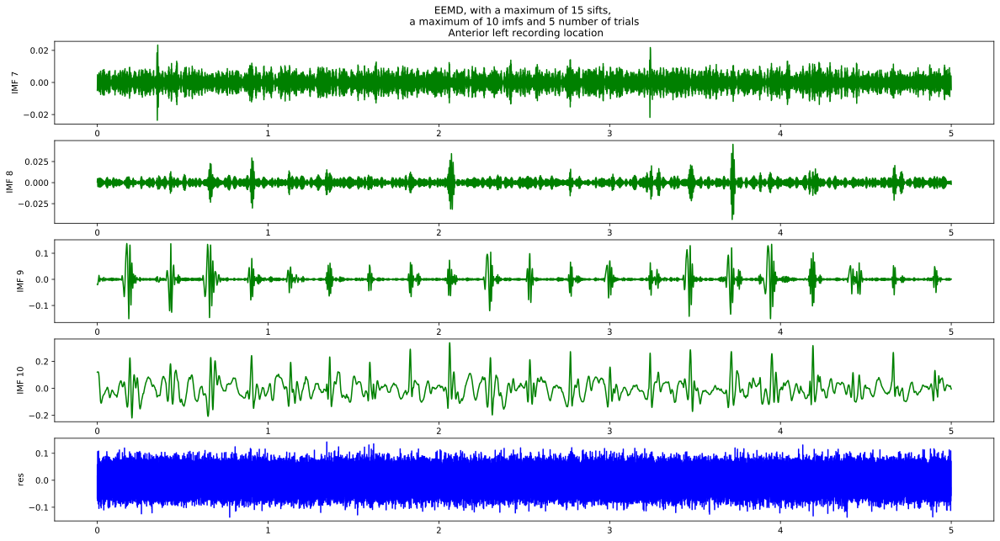

In [208]:
# Plot results
best_IMFS = [7,8,9,10]
fig, axarr = plt.subplots(len(best_IMFS)+1)
fig.set_size_inches(20, 10.5)
axarr[0].set_title(f'EEMD, with a maximum of {m_sift} sifts, \n a maximum of {m_imf} imfs and {m_trials} number of trials \n{rec_location}recording location')
#axarr[0].plot(x, audio, 'r')
#axarr[0].set_ylabel("original\n audio")

for n in range(neIMFs_left):
    if n in best_IMFS:
        idx = best_IMFS.index(n)
        axarr[idx].plot(x, eIMFs_left[n], 'g')
        axarr[idx].set_ylabel("IMF %i" %(n))
        #plt.locator_params(axis='y', nbins=5)

axarr[len(best_IMFS)].plot(x, residue_left, 'b')
axarr[len(best_IMFS)].set_ylabel("res")
axarr[len(best_IMFS)-1].set_xlabel("Time [s]")
fig.show()
#fig.savefig('EEMD_left_best.svg', bbox_inches='tight')

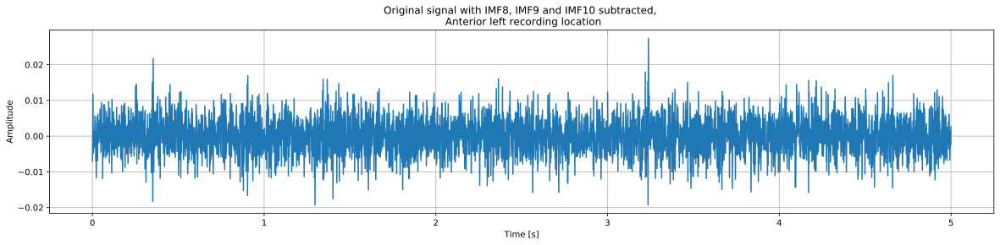

In [249]:
test =  audio - eIMFs[9] - eIMFs[8] - eIMFs[10]
plt.figure(figsize=(20, 4))
plt.plot(x,test)
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.title(f'Original signal with IMF8, IMF9 and IMF10 subtracted, \n{rec_location}recording location')
plt.grid()
plt.draw()
plt.savefig('audio_left_IMF8910_subtract.svg', bbox_inches='tight')

# Playing the audio

In [254]:
import IPython.display as ipd
ipd.Audio(test, rate = sr)

In [245]:
import IPython.display as ipd
ipd.Audio(audio, rate = sr)

In [259]:
import IPython.display as ipd
ipd.Audio(audio_f, rate = sr)

In [255]:
audio_test = audio_f
import IPython.display as ipd
ipd.Audio(audio_test, rate = sr)

# FFT of the chosen IMFs

best_IMFs sets the IMFs we want to plot

In [261]:
from scipy.fftpack import fft
n_samples = 6000
xf = np.linspace(0.0, 1.0/(2.0*T), N//2)

best_IMFS = [7,8,9,10]
fig, axarr = plt.subplots(len(best_IMFS), sharex=True)
fig.set_size_inches(15, 10.5)
axarr[0].set_title(f'FFT of the eIMFs, \n{rec_location}recording location')

for n in range(neIMFs):
    if n in best_IMFS:
        yf = fft(eIMFs[n])

        xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
        
        yf = yf[0:n_samples]
        xf = xf[0:n_samples]
        idx = best_IMFS.index(n)
        axarr[idx].plot(xf, 2.0/N * np.abs(yf[0:N//2]), 'p')
        axarr[idx].set_ylabel("IMF %i" %(n))
        #plt.locator_params(axis='y', nbins=5)

axarr[len(best_IMFS)-1].set_xlabel("Frequency [Hz]")
fig.show()
fig.savefig('FFT_of_eIMFs_left.svg', bbox_inches='tight')

/home/andrine/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


# Hilbert Transform

/home/andrine/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


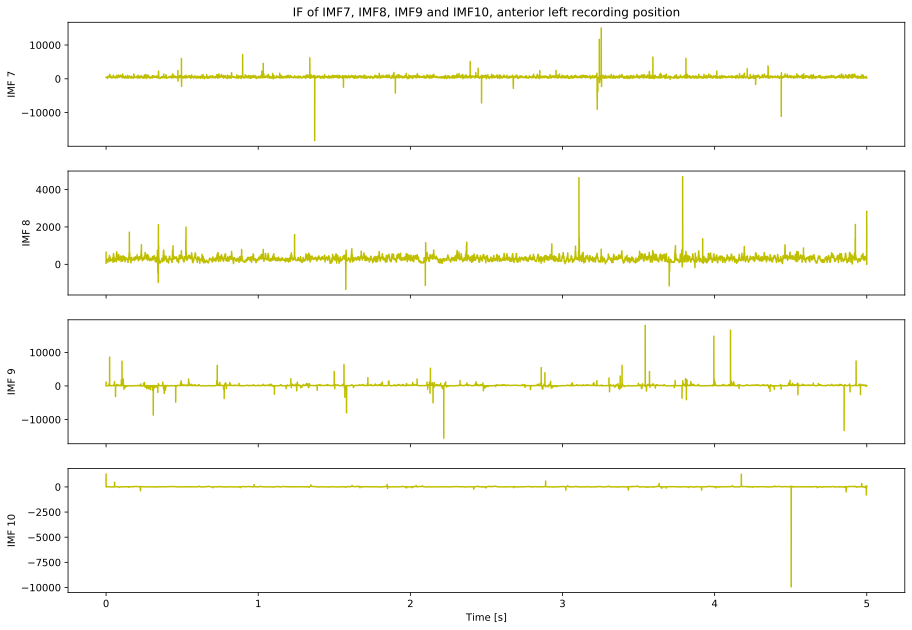

In [235]:
from scipy.signal import hilbert
duration = float(len(audio)) / sr
samples = len(audio)
t = np.arange(samples) / sr
T = 1.0/sr
N = int(duration / T)
best_IMFS = [7,8,9,10]
fig, axarr = plt.subplots(len(best_IMFS), sharex=True)
fig.set_size_inches(15, 10.5)
axarr[0].set_title(f'IF of IMF7, IMF8, IMF9 and IMF10,{rec_location}recording position')

for n in range(neIMFs):
    if n in best_IMFS:
        analytic_signal = hilbert(eIMFs[n])
        amplitude_envelope = np.abs(analytic_signal)
        instantaneous_phase = np.unwrap(np.angle(analytic_signal))
        instantaneous_frequency = (np.diff(instantaneous_phase)/(2.0*np.pi) * sr)
        
        idx = best_IMFS.index(n)
        axarr[idx].plot(t[1:], instantaneous_frequency, 'y')
        axarr[idx].set_ylabel("IMF %i" %(n))


axarr[len(best_IMFS)-1].set_xlabel('Time [s]')
fig.show()



#plt.savefig('EMD_IF.png', bbox_inches='tight')